In [2]:
#import necessary modules, set up the plotting
import numpy as np
#%matplotlib inline
#%config InlineBackend.figure_format = 'svg'
import matplotlib 
from matplotlib import pyplot as plt 
plt.style.use('ggplot')
import GPy

# Why use a Gaussian distribution ? 

$$ \Large \dfrac{1}{(2 \pi)^{N/2} |\Sigma|^{1/2}} \exp \left[ -\dfrac{1}{2}(x - \mu)^T \Sigma^{-1}(x - \mu) \right]$$


Almost nothing has a Gaussian distribution. 

Gaussian Makes computations easy (like linear approximations).

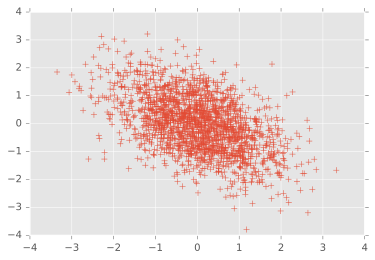

In [2]:
mu = [0, 0]
Sigma = [[1, -0.5], [-0.5, 1]]  # diagonal covariance 

x, y = np.random.multivariate_normal(mu, Sigma, 2000).T

plt.plot(x, y, '+')

# Normal DISTRIBUTIONS are closed under some operations:

## Multiplication

$$ \Large \mathcal{N}(x; a, A)\mathcal{N}(x; b, B) = \mathcal{N}(x; c, C)\mathcal{N}(a; b, A + B)$$

Where: 

$$ \Large C := (A^{-1} + B^{-1})^{-1} \quad c:= C(A^{-1}a + B^{-1}b)$$ 

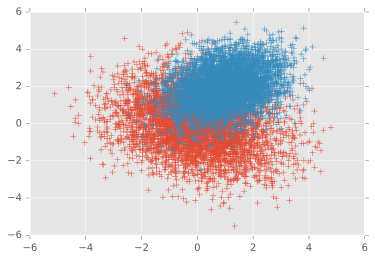

In [3]:
a = [0, 0]
A = [[2, -0.5], [-0.5, 2]]  

xa, ya = np.random.multivariate_normal(a, A, 5000).T

b = [1, 2]
B = [[1, 0.3], [0.3, 1]]  

xb, yb = np.random.multivariate_normal(b, B, 5000).T

plt.plot(xa, ya, '+',  xb, yb, '+')

In [4]:
AInv = np.linalg.inv(A)
BInv = np.linalg.inv(B)

C = np.linalg.inv((AInv + BInv))
c = np.dot(C, np.dot(AInv, a) + np.dot(BInv, b))

xc, yc = np.random.multivariate_normal(c, C, 5000).T
plt.plot(xa, ya, '+', alpha=0.2)
plt.plot(xb, yb, '+', alpha=0.2) 
plt.plot(xc, yc, '+') 
plt.show()

## Linear Projections

$$ \Large \mathcal{N}(x; \mu, \Sigma) \Rightarrow \mathcal{N}(Ax; A\mu, A\Sigma A^T)$$

with: 

$$ \Large A = [1, 0.9] $$


In [5]:
x, y = np.random.multivariate_normal(mu, Sigma, 5000).T

A = np.array([[1, 0.9]])
Amu = np.dot(A, mu)
ASigmaA = A.dot(Sigma).dot(A.transpose())

Ay = np.random.normal(Amu, ASigmaA, 5000).T

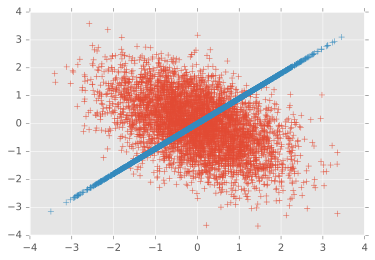

In [6]:
slope = 1/0.9
AY = np.array(Ay, ndmin=2).transpose()
Z = np.zeros((5000, 1))
R = [[1, -slope], [slope, 1]]

RData = np.dot(np.concatenate((Z, AY), axis=1), R)
Rx = RData[:,0]
Ry = RData[:,1]

plt.plot(x, y, '+')
plt.plot(Rx, Ry, '+')

## Marginalization


$$ \Large \int{\mathcal{N}\left(\begin{bmatrix} x \\ y \end{bmatrix}; 
    \begin{bmatrix} \mu_{x}\\ \mu_{y} \end{bmatrix}, 
    \begin{bmatrix} \Sigma_{xx} & \Sigma_{xy}\\ \Sigma_{yx} & \Sigma_{yy} \end{bmatrix} \right)}dy
    =  \mathcal{N}(x; \mu_x, \Sigma_{xx})
    $$
  
Projection with:

$$ \Large A = [1, 0] $$


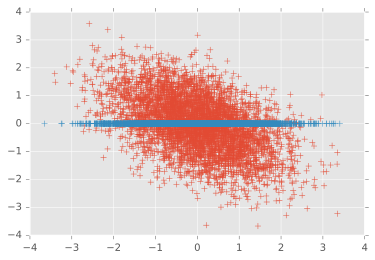

In [7]:
A = np.array([[1, 0]])
Amu = np.dot(A, mu)
ASigmaA = A.dot(Sigma).dot(A.transpose())

Ay = np.random.normal(Amu, ASigmaA, 5000).T

plt.plot(x, y, '+')
plt.plot(Ay, np.zeros(5000), '+')

## Conditioning

$$ \Large p(x|y) = \dfrac{p(x, y)}{p(y)} = \mathcal{N}(x; \mu_x + \Sigma_{xy}\Sigma_{yy}^{-1}(y - \mu_y), \Sigma_{xx} - \Sigma_{xy}\Sigma_{yy}^{-1}\Sigma_{yx}) $$

In [8]:
S = np.array(Sigma)
loc = mu[0] + S[0,1]/S[1, 1]*mu[1]
scale = S[0,0] - S[0,1]*S[0,1]/S[1, 1]

xGy = np.random.normal(loc, scale, size = 5000).T

plt.plot(x, y, '+')
plt.plot(Ay, np.zeros(5000), '+', alpha=0.2)
plt.plot(xGy, np.zeros(5000), '+', alpha=0.3, color="orange")


## Gaussian = Linear Algebra!

# Bayesian Inference

I want to know the prize of an americano and a pack of cookies. An americano costs something like $1 and a pack of cookies (~30 grams) 50 cents. 

G = price Galletas, C = price Cafe.

$$ \Large P(G, C) = \mathcal{N}\left(
    \begin{bmatrix} C \\ G \end{bmatrix}; 
    \begin{bmatrix} 1\\ 0.5 \end{bmatrix}, 
    \begin{bmatrix} 3^2 & 0 \\ 0 & 3^2 \end{bmatrix} 
    \right)
$$

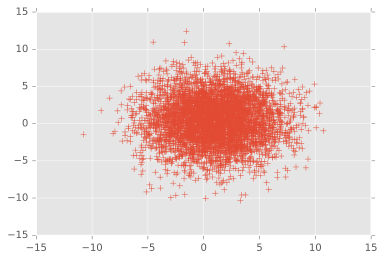

In [9]:
mu = [1, 0.5]
Sigma = [[9, 0], [0, 9]]  # diagonal covariance 

x, y = np.random.multivariate_normal(mu, Sigma, 5000).T

plt.plot(x, y, '+')

### Buy 1 Americano and 60 grams of cookies and payed something like $6.

$$ \Large P(6 | \ 1 \ C \ and \ 0.6 \ G) = \mathcal{N}\left(
    6; 
    A \begin{bmatrix} C \\ G \end{bmatrix}, 
    A \begin{bmatrix} 3^2 & 0 \\ 0 & 3^2 \end{bmatrix} A^{T} 
    \right) 
$$

Where 

$$ \large  A:= \begin{bmatrix} 1 & 0.6 \end{bmatrix} $$


### I am given some information. Now, I can update my beleif about the price of C and G. 


$$ \Large p(x| y) = \dfrac{p(y | x)p(x)}{p(y)} = \mathcal{N} \left(x; \mu + \Sigma A (A^T \Sigma A)^{-1}(y - A^T\mu), \ \Sigma -  \Sigma A (A^T \Sigma A)^{-1} A^T \Sigma  \right)$$

Where 

$$ \Large x = (C, G), \  y = Ax $$

$$ \Large P(x | y) = \mathcal{N}\left(
    x; 
    \begin{bmatrix} 3.9 \\ 2.3 \end{bmatrix}, 
    \begin{bmatrix} 3.4 & -3.4 \\ -3.4 & 7 \end{bmatrix} 
    \right) 
$$

Obs: Now C and G are corrolated. Expensive milk -> cheap butter. 

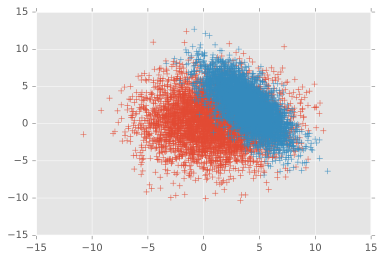

In [10]:
muCy = [3.9, 2.3]
SigmaCy = [[3.4, -3.4], [-3.4, 7]]  # diagonal covariance 

xCy, yCy = np.random.multivariate_normal(muCy, SigmaCy, 5000).T

plt.plot(x, y, '+')
plt.plot(xCy, yCy, '+')

# Linear Regression

Given $ y $ and $ p(y\ | \ f) $ what is f? 

<Container object of 3 artists>

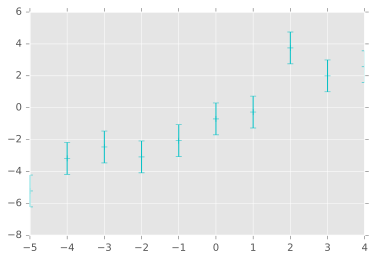

In [11]:
x = list(range(-5, 5))
y = x + np.random.normal(loc=0, scale=1.3, size=len(x))

plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")

 ## Maybe there is a simple f behind this data. 
 
 $$ \Large f(x) = a_0 + a_1 x =: \phi_x^T a $$ 
 
 How would you chose a? 
 
 $$ \Large p(a) = \mathcal{N}(a; \mu, \Sigma) $$
 
 Then, 
 
 $$ \Large p(f) = \mathcal{N}\left(f; \ \phi_x^T\mu, \ \phi_x^T\Sigma\phi_x \right) $$

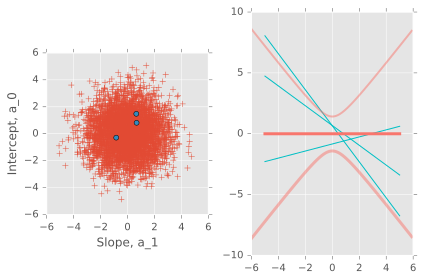

In [13]:
mu = [0, 0]
Sigma = [[2, 0], [0, 2]]  # diagonal covariance 

a, b = np.random.multivariate_normal(mu, Sigma, 5000).T
a3, b3 = np.random.multivariate_normal(mu, Sigma, 3).T

# Line distribution
Xs =np.array(np.arange(-6, 6, 0.1), ndmin=2).transpose()
Os = np.ones((len(Xs), 1))
phi = np.concatenate((Os, Xs), axis=1)
Sd = np.sqrt(np.diagonal(phi.dot(Sigma).dot(phi.T)))

f, (ax1, ax2) = plt.subplots(1, 2)
f.figsize=(10, 8)
ax1.plot(a, b, '+')
ax1.plot(a3, b3, 'o', markersize = 5)
ax1.set_xlabel('Slope, a_1')
ax1.set_ylabel('Intercept, a_0')
ax1.set_aspect('equal')
ax2.plot([5, -5], [a3[0] - 5*b3[0] , a3[0] + 5*b3[0]], color="#00BFC4")
ax2.plot([5, -5], [a3[1] - 5*b3[1] , a3[1] + 5*b3[1]], color="#00BFC4")
ax2.plot([5, -5], [a3[2] - 5*b3[2] , a3[2] + 5*b3[2]], color="#00BFC4")
ax2.plot([5, -5], [0 , 0], color="#F8766D", linewidth=3)
ax2.plot(Xs, Sd, color="#F8766D", alpha=0.5, linewidth=2)
ax2.plot(Xs, -Sd, color="#F8766D", alpha=0.5, linewidth=3)
f.tight_layout()

f.savefig('output.png', dpi=300)
# https://stackoverflow.com/questions/8197559/emulate-ggplot2-default-color-palette

## Prior over the params. became a prior over the function values. 

The distribution has 2 degrees of freedom: $a_0$ and $a_1$.

## The posterior over the weights

$$ \Large p(a | \ y, \ \phi_x) =  \mathcal{N} \left(a; \mu + \Sigma \phi_X (\phi_X^T \Sigma \phi_X)^{-1}(y - \phi_X^T\mu), \ \Sigma -  \Sigma \phi_X (\phi_X^T \Sigma \phi_X)^{-1} \phi_X \Sigma \right) $$


## The posterior over the function values

$$ \Large p(f \ | \ y, \ \phi_x) =  \mathcal{N} \left(x; \phi_x^T\mu + \phi_x^T \Sigma \phi_X (\phi_X^T \Sigma \phi_X)^{-1}(y - \phi_X^T\mu), \ \phi_x^T \Sigma \phi_x -  \phi_x^T \Sigma \phi_X (\phi_X^T \Sigma \phi_X)^{-1} \phi_x \Sigma \phi_X^T \right) $$


In [13]:
Xobs = np.array(x, ndmin=2).transpose() 
Oobs = np.ones((len(Xobs), 1))
phiX = np.concatenate((Oobs, Xobs), axis=1).T

Xnew =np.array(np.arange(-6, 6, 0.1), ndmin=2).transpose()
Onew = np.ones((len(Xnew), 1))
phix = np.concatenate((Onew, Xnew), axis=1).T

# use .shape to get the dimensions of a matrix. 

S = np.array(Sigma)
Y = np.array(y)
m = phix.T.dot(mu)
M = phiX.T.dot(mu)

kxx = (phix.T).dot(S).dot(phix)
kxX = (phix.T).dot(S).dot(phiX)
kXX = (phiX.T).dot(S).dot(phiX) + 0.01 * np.eye(len(Xobs)) # add noise to have a pos def. 

IkXX = np.linalg.inv(kXX)

mpost = m + kxX.dot(IkXX).dot((Y - M))
vpost = kxx - kxX.dot(IkXX).dot(kxX.T)
sdpost = np.sqrt(vpost.diagonal())


<Container object of 3 artists>

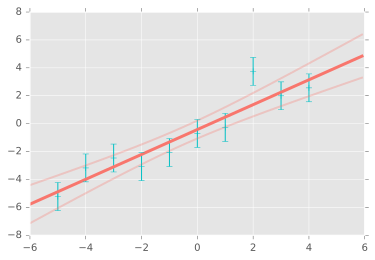

In [14]:
plt.plot(Xnew, mpost, color="#F8766D", linewidth=3)
plt.plot(Xnew, mpost + 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.plot(Xnew, mpost - 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")

## Reading the posterior mean

$$ \Large \phi_x^T\mu + \underbrace{ \phi_x^T \Sigma \phi_X }_{New obs} \underbrace{(\phi_X^T \Sigma \phi_X)^{-1}}_{Surprise\ term} \underbrace{(y - \phi_X^T\mu)}_{Err\ term} $$

Err term: residual from best prediction (usign $\phi_x^T \mu$).

Surprise term: proportional to the observed variation. 

# Non linear data


<Container object of 3 artists>

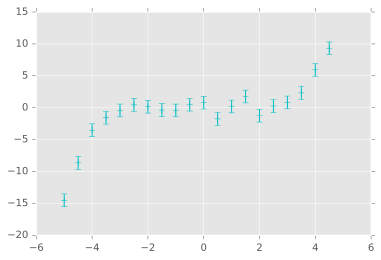

In [15]:
x = np.arange(-5, 5, 0.5)

# f(x) = (x3 + 3x2 − 6x − 8)/4.
y = (np.power(x, 5) - np.power(x, 3) + np.power(3*x, 2) - 6*x - 8  + np.random.normal(loc=0, scale=200, size=len(x)))/200

plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")


## Use non-linear features

$$\Large f(x) = \phi_x^T a $$

<Container object of 3 artists>

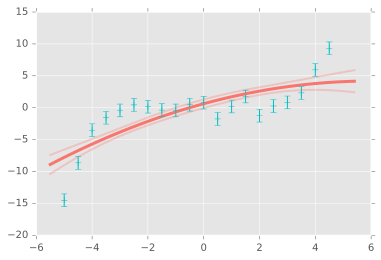

In [43]:
# Train data and pred points
# use something like phi = @(a)(Sbsxfun(@power,a,0:F-1));

F = 2
nObs = len(x)
phiX = np.zeros((F, nObs))
for f in range(0, F):
    phif = np.array(np.power(x, f+1), ndmin=2)
    phiX[f,:] = phif

Oobs = np.ones((nObs, 1)).T
phiX = np.concatenate((Oobs, phiX), axis=0)

xnew = np.arange(-5.5, 5.5, 0.1)
nNew = len(xnew)
phix = np.zeros((F, nNew))
for f in range(0, F):
    phif = np.array(np.power(xnew, f+1), ndmin=2)
    phix[f,:] = phif

Onew = np.ones((nNew, 1)).T
phix = np.concatenate((Onew, phix), axis=0)

# prior on w
mu = np.zeros((F+1, 1))
S = np.eye(F+1)

# use .shape to get the dimensions of a matrix. 
Y = np.array(y, ndmin=2).T
m = phix.T.dot(mu)
M = phiX.T.dot(mu)

kxx = (phix.T).dot(S).dot(phix)
kxX = (phix.T).dot(S).dot(phiX)
kXX = (phiX.T).dot(S).dot(phiX) + 0.01 * np.eye(len(phiX.T)) # add noise to have a pos def. 

IkXX = np.linalg.inv(kXX)

mpost = m + kxX.dot(IkXX).dot((Y - M))
vpost = kxx - kxX.dot(IkXX).dot(kxX.T)
sdpost = np.array(np.sqrt(vpost.diagonal()), ndmin=2).T

plt.plot(xnew, mpost, color="#F8766D", linewidth=3)
plt.plot(xnew, mpost + 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.plot(xnew, mpost - 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")


obs: too certain, even though some predictions are diff from the observed values! 

(-0.2, 2.2)

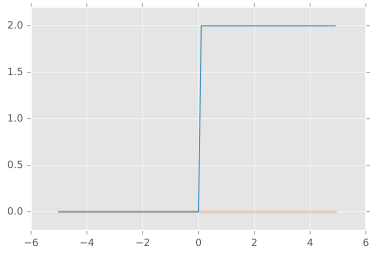

In [44]:
xS = np.arange(-5, 5, 0.1)
yS = np.sign(xS) + 1
y0 =np.zeros(len(xS))

plt.plot(xS, y0, linewidth = 3, alpha = 0.2)
plt.plot(xS, yS)

plt.ylim(-0.2, 2.2)

(-20, 20)

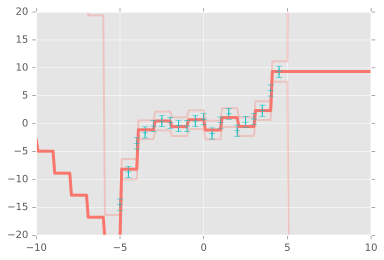

In [45]:
# Train data and pred points
# use something like phi = @(a)(bsxfun(@power,a,0:F-1));

F = 10
nObs = len(x)
phiX = np.zeros((2*F + 1, nObs))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.sign(x - f) + 1, ndmin=2)
    phiX[k,:] = phif
    k = k + 1

Oobs = np.ones((nObs, 1)).T
phiX = np.concatenate((Oobs, phiX), axis=0)

xnew = np.arange(-10, 10, 0.1)
nNew = len(xnew)
phix = np.zeros((2*F + 1, nNew))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.sign(xnew - f) + 1, ndmin=2)
    phix[k,:] = phif
    k = k +1

Onew = np.ones((nNew, 1)).T
phix = np.concatenate((Onew, phix), axis=0)

# prior on w
mu = np.zeros((len(phix), 1))
S = np.eye(len(phix))

# use .shape to get the dimensions of a matrix. 
Y = np.array(y, ndmin=2).T
m = phix.T.dot(mu)
M = phiX.T.dot(mu)

kxx = (phix.T).dot(S).dot(phix)
kxX = (phix.T).dot(S).dot(phiX)
kXX = (phiX.T).dot(S).dot(phiX) + 0.01 * np.eye(len(phiX.T)) # add noise to have a pos def. 

IkXX = np.linalg.inv(kXX)

mpost = m + kxX.dot(IkXX).dot((Y - M))
vpost = kxx - kxX.dot(IkXX).dot(kxX.T)
sdpost = np.array(np.sqrt(vpost.diagonal()), ndmin=2).T

plt.plot(xnew, mpost, color="#F8766D", linewidth=3)
plt.plot(xnew, mpost + 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.plot(xnew, mpost - 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")
plt.xlim(-10, 10)
plt.ylim(-20, 20)


(-1.2, 1.2)

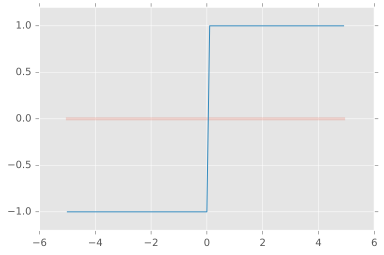

In [46]:
xS = np.arange(-5, 5, 0.1)
yS = np.sign(xS)
y0 =np.zeros(len(xS))

plt.plot(xS, y0, linewidth = 3, alpha = 0.2)
plt.plot(xS, yS)

plt.ylim(-1.2, 1.2)

(-20, 20)

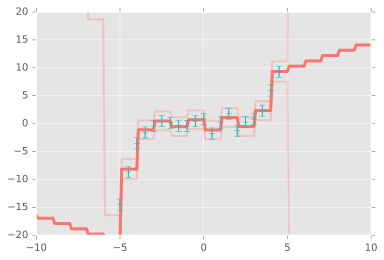

In [47]:
# Train data and pred points
# use something like phi = @(a)(bsxfun(@power,a,0:F-1));

F = 10
nObs = len(x)
phiX = np.zeros((2*F + 1, nObs))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.sign(x - f), ndmin=2)
    phiX[k,:] = phif
    k = k + 1

Oobs = np.ones((nObs, 1)).T
phiX = np.concatenate((Oobs, phiX), axis=0)

xnew = np.arange(-10, 10, 0.1)
nNew = len(xnew)
phix = np.zeros((2*F + 1, nNew))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.sign(xnew - f), ndmin=2)
    phix[k,:] = phif
    k = k +1

Onew = np.ones((nNew, 1)).T
phix = np.concatenate((Onew, phix), axis=0)

# prior on w
mu = np.zeros((len(phix), 1))
S = np.eye(len(phix))

# use .shape to get the dimensions of a matrix. 
Y = np.array(y, ndmin=2).T
m = phix.T.dot(mu)
M = phiX.T.dot(mu)

kxx = (phix.T).dot(S).dot(phix)
kxX = (phix.T).dot(S).dot(phiX)
kXX = (phiX.T).dot(S).dot(phiX) + 0.01 * np.eye(len(phiX.T)) # add noise to have a pos def. 

IkXX = np.linalg.inv(kXX)

mpost = m + kxX.dot(IkXX).dot((Y - M))
vpost = kxx - kxX.dot(IkXX).dot(kxX.T)
sdpost = np.array(np.sqrt(vpost.diagonal()), ndmin=2).T

plt.plot(xnew, mpost, color="#F8766D", linewidth=3)
plt.plot(xnew, mpost + 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.plot(xnew, mpost - 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")
plt.xlim(-10, 10)
plt.ylim(-20, 20)

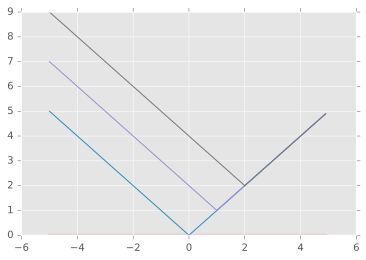

In [48]:
xS = np.arange(-5, 5, 0.1)
yS1 = np.absolute(xS) 
yS2 = np.absolute(xS - 1) + 1 
yS3 = np.absolute(xS - 2) + 2 
y0 =np.zeros(len(xS))

plt.plot(xS, y0, linewidth = 3, alpha = 0.2)
plt.plot(xS, yS1)
plt.plot(xS, yS2)
plt.plot(xS, yS3)


(-20, 20)

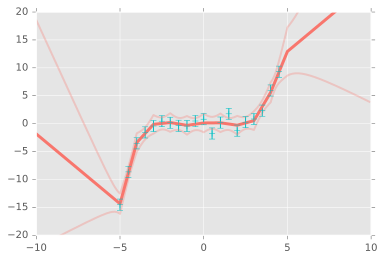

In [50]:
F = 5
nObs = len(x)
phiX = np.zeros((2*F + 1, nObs))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.absolute(x - f) + f, ndmin=2)
    phiX[k,:] = phif
    k = k + 1

Oobs = np.ones((nObs, 1)).T
phiX = np.concatenate((Oobs, phiX), axis=0)

xnew = np.arange(-10, 10, 0.1)
nNew = len(xnew)
phix = np.zeros((2*F + 1, nNew))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.absolute(xnew - f) + f, ndmin=2)
    phix[k,:] = phif
    k = k +1

Onew = np.ones((nNew, 1)).T
phix = np.concatenate((Onew, phix), axis=0)

# prior on w
mu = np.zeros((len(phix), 1))
S = np.eye(len(phix))

# use .shape to get the dimensions of a matrix. 
Y = np.array(y, ndmin=2).T
m = phix.T.dot(mu)
M = phiX.T.dot(mu)

kxx = (phix.T).dot(S).dot(phix)
kxX = (phix.T).dot(S).dot(phiX)
kXX = (phiX.T).dot(S).dot(phiX) + 0.01 * np.eye(len(phiX.T)) # add noise to have a pos def. 

IkXX = np.linalg.inv(kXX)

mpost = m + kxX.dot(IkXX).dot((Y - M))
vpost = kxx - kxX.dot(IkXX).dot(kxX.T)
sdpost = np.array(np.sqrt(vpost.diagonal()), ndmin=2).T

plt.plot(xnew, mpost, color="#F8766D", linewidth=3)
plt.plot(xnew, mpost + 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.plot(xnew, mpost - 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")
plt.xlim(-10, 10)
plt.ylim(-20, 20)

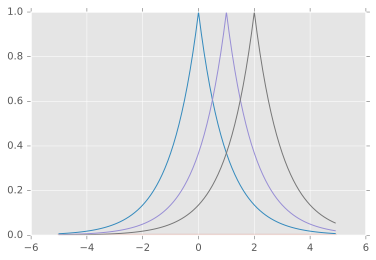

In [53]:
xS = np.arange(-5, 5, 0.1)
yS1 = np.exp(-np.absolute(xS)) 
yS2 = np.exp(-np.absolute(xS - 1)) 
yS3 = np.exp(-np.absolute(xS - 2))  
y0 =np.zeros(len(xS))

plt.plot(xS, y0, linewidth = 3, alpha = 0.2)
plt.plot(xS, yS1)
plt.plot(xS, yS2)
plt.plot(xS, yS3)

(-20, 20)

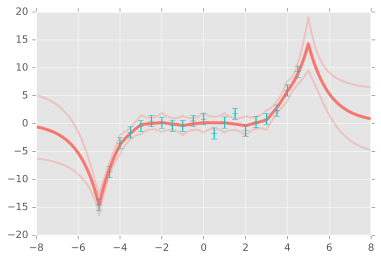

In [63]:
F = 5
nObs = len(x)
phiX = np.zeros((2*F + 1, nObs))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.exp(-np.absolute(x - f)), ndmin=2)
    phiX[k,:] = phif
    k = k + 1

Oobs = np.ones((nObs, 1)).T
phiX = np.concatenate((Oobs, phiX), axis=0)

xnew = np.arange(-10, 10, 0.1)
nNew = len(xnew)
phix = np.zeros((2*F + 1, nNew))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.exp(-np.absolute(xnew - f)), ndmin=2)
    phix[k,:] = phif
    k = k +1

Onew = np.ones((nNew, 1)).T
phix = np.concatenate((Onew, phix), axis=0)

# prior on w
mu = np.zeros((len(phix), 1))
S = np.eye(len(phix))

# use .shape to get the dimensions of a matrix. 
Y = np.array(y, ndmin=2).T
m = phix.T.dot(mu)
M = phiX.T.dot(mu)

kxx = (phix.T).dot(S).dot(phix)
kxX = (phix.T).dot(S).dot(phiX)
kXX = (phiX.T).dot(S).dot(phiX) + 0.01 * np.eye(len(phiX.T)) # add noise to have a pos def. 

IkXX = np.linalg.inv(kXX)

mpost = m + kxX.dot(IkXX).dot((Y - M))
vpost = kxx - kxX.dot(IkXX).dot(kxX.T)
sdpost = np.array(np.sqrt(vpost.diagonal()), ndmin=2).T

plt.plot(xnew, mpost, color="#F8766D", linewidth=3)
plt.plot(xnew, mpost + 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.plot(xnew, mpost - 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")
plt.xlim(-8, 8)
plt.ylim(-20, 20)

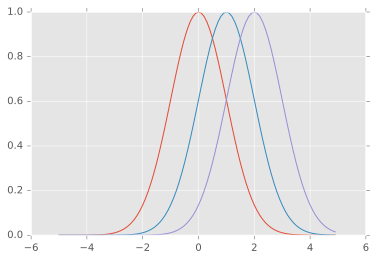

In [60]:
xS = np.arange(-5, 5, 0.1)
yS1 = np.exp(-0.5*np.absolute(xS*xS)) 
yS2 = np.exp(-0.5*np.absolute((xS - 1)*(xS - 1))) 
yS3 = np.exp(-0.5*np.absolute((xS - 2)*(xS - 2)))  

plt.plot(xS, yS1)
plt.plot(xS, yS2)
plt.plot(xS, yS3)

(-20, 20)

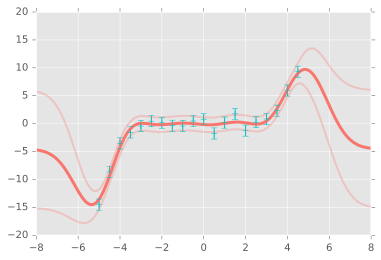

In [64]:
F = 5
nObs = len(x)
phiX = np.zeros((2*F + 1, nObs))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.exp(-0.5*(x - f)*(x - f)), ndmin=2)
    phiX[k,:] = phif
    k = k + 1

Oobs = np.ones((nObs, 1)).T
phiX = np.concatenate((Oobs, phiX), axis=0)

xnew = np.arange(-10, 10, 0.1)
nNew = len(xnew)
phix = np.zeros((2*F + 1, nNew))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.exp(-0.5*(xnew - f)*(xnew - f)), ndmin=2)
    phix[k,:] = phif
    k = k +1

Onew = np.ones((nNew, 1)).T
phix = np.concatenate((Onew, phix), axis=0)

# prior on w
mu = np.zeros((len(phix), 1))
S = np.eye(len(phix))

# use .shape to get the dimensions of a matrix. 
Y = np.array(y, ndmin=2).T
m = phix.T.dot(mu)
M = phiX.T.dot(mu)

kxx = (phix.T).dot(S).dot(phix)
kxX = (phix.T).dot(S).dot(phiX)
kXX = (phiX.T).dot(S).dot(phiX) + 0.01 * np.eye(len(phiX.T)) # add noise to have a pos def. 

IkXX = np.linalg.inv(kXX)

mpost = m + kxX.dot(IkXX).dot((Y - M))
vpost = kxx - kxX.dot(IkXX).dot(kxX.T)
sdpost = np.array(np.sqrt(vpost.diagonal()), ndmin=2).T

plt.plot(xnew, mpost, color="#F8766D", linewidth=3)
plt.plot(xnew, mpost + 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.plot(xnew, mpost - 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")
plt.xlim(-8, 8)
plt.ylim(-20, 20)

In [ ]:
F = 5
nObs = len(x)
phiX = np.zeros((2*F + 1, nObs))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.exp(-0.5*(x - f)*(x - f)), ndmin=2)
    phiX[k,:] = phif
    k = k + 1

Oobs = np.ones((nObs, 1)).T
phiX = np.concatenate((Oobs, phiX), axis=0)

xnew = np.arange(-10, 10, 0.1)
nNew = len(xnew)
phix = np.zeros((2*F + 1, nNew))
k = 0
for f in range(-F, (F+1)):
    phif = np.array(np.exp(-0.5*(xnew - f)*(xnew - f)), ndmin=2)
    phix[k,:] = phif
    k = k +1

Onew = np.ones((nNew, 1)).T
phix = np.concatenate((Onew, phix), axis=0)

# prior on w
mu = np.zeros((len(phix), 1))
S = np.eye(len(phix))

# use .shape to get the dimensions of a matrix. 
Y = np.array(y, ndmin=2).T
m = phix.T.dot(mu)
M = phiX.T.dot(mu)

kxx = (phix.T).dot(S).dot(phix)
kxX = (phix.T).dot(S).dot(phiX)
kXX = (phiX.T).dot(S).dot(phiX) + 0.01 * np.eye(len(phiX.T)) # add noise to have a pos def. 

IkXX = np.linalg.inv(kXX)

mpost = m + kxX.dot(IkXX).dot((Y - M))
vpost = kxx - kxX.dot(IkXX).dot(kxX.T)
sdpost = np.array(np.sqrt(vpost.diagonal()), ndmin=2).T

plt.plot(xnew, mpost, color="#F8766D", linewidth=3)
plt.plot(xnew, mpost + 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.plot(xnew, mpost - 20*sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.errorbar(x, y, yerr=1, fmt='+', color="#00BFC4")
plt.xlim(-8, 8)
plt.ylim(-20, 20)

In [65]:
# Latent Doodle Space:
# https://vimeo.com/3235882

## Choosing a feature set is choosing a language to describe your problem.

## How many features? 

$$ \Large p(f \ | \ y, \ \phi_x) =  \mathcal{N} \left(x; \phi_x^T\mu  + \phi_x^T \Sigma \phi_X (\phi_X^T \Sigma \phi_X)^{-1}(y - \phi_X^T\mu), \ \phi_x^T \Sigma \phi_x -  \phi_x^T \Sigma \phi_X (\phi_X^T \Sigma \phi_X)^{-1} \phi_x \Sigma \phi_X^T \right) $$

The posterior proba does NOT contains any single $\Large \phi$. To compute it you need two objects:

The mean function <font color='red'> $$ \Large x \mapsto \phi_x^T \mu $$ </font>

and the kernel <font color='green'> $$ \Large (x, y) \mapsto \phi_x^T \Sigma \phi_y $$ </font>

# Limits of features


$$ \Large \Sigma := \dfrac{\sigma^2 (c_{max} - c_{inf})}{F}I $$

and

$$ \Large \phi_l(x) := \exp \left( - \dfrac{ ( x - c_l )^2}{2 \lambda^2 } \right)$$

Then, 

$$ \Large
\begin{align*}
 \phi_l(x_i)^T \Sigma  \phi_l(x_j) &= \dfrac{\sigma^2 (c_{sup} - c_{inf})}{F} \sum_{l=1}^F \exp \left( - \dfrac{( x_i - c_l )^2}{2 \lambda^2 } \right) \exp \left( - \dfrac{( x_j - c_l )^2}{2 \lambda^2 } \right) \\
                                   &= \dfrac{\sigma^2 (c_{sup} - c_{inf})}{F} \exp \left( - \dfrac{( x_i - x_j )^2}{4\lambda^2 } \right) \sum_{l=1}^F \exp \left( - \dfrac{( c_l - 0.5(x_i + x_j) )^2}{2 \lambda^2 } \right)
\end{align*}
$$


At the limit when $ \Large F \rightarrow \infty $, 

$$ \Large \phi_l(x_i)^T \Sigma  \phi_l(x_j) \longrightarrow k(x_i, x_j) := \sqrt{2 \pi} \sigma^2 \lambda \exp \left( - \dfrac{( x_i - x_j )^2}{4\lambda^2 } \right) $$

## Mercel Kernel

Is a function $\Large k $ such that for any set of points $  \Large X := [x_1, ... , x_n] $, the matrix $\Large k_{XX}$ is positive semidefinite. 

## Lemma

All kernels can be written as:

$$ \Large k(x, x') = \int \phi_l(x)\phi_l(x') dl $$

## Gaussian process

Take a mercel kernel $\Large k$ and a mean function $\Large m$. The limitng object is called a Gaussian process. It is a probability distribution over functions. We will note it

$$ \Large p(f) = \mathcal{GP} \left(f; m, k \right) $$

## Other limits

step (Heaviside) functions $\Large \longrightarrow k(x_i, x_j) := min(x_i, x_j)$. A Wiener process. 

Has a Markov like property on the observations. 

[Grace Whaba]

Easy matrix inversion in linear time (se Kalman filter). 

(-1,1)-Steps,  $\Large \longrightarrow k(x_i, x_j) := 1 + b -2b |x_i - x_j|$ 

V-shaped functions $\Large \longrightarrow k(x_i, x_j) := 1 + (1 + b)x_i x_j - \dfrac{b}{3} (|x_i - x_j|^3 - x^3 - y^3)$ 


 C:\Users\Personal\Anaconda3\lib\site-packages\ipykernel\__main__.py:11: RuntimeWarning:covariance is not positive-semidefinite.


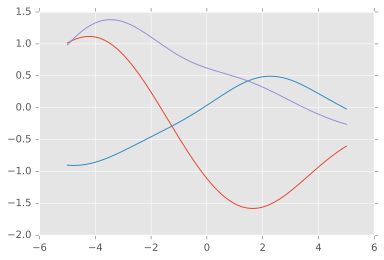

In [93]:
import GPy

X = np.linspace(-5, 5.,500) # 500 points evenly spaced over [0,1]
X = X[:,None] # reshape X to make it n*D

k = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=3)
mu = np.zeros((500)) # vector of the means
C = k.K(X,X) # covariance matrix

# Generate 20 sample path with mean mu and covariance C
Z = np.random.multivariate_normal(mu,C,20)
plt.figure() # open new plotting window
for i in range(3):
    plt.plot(X[:],Z[i,:])


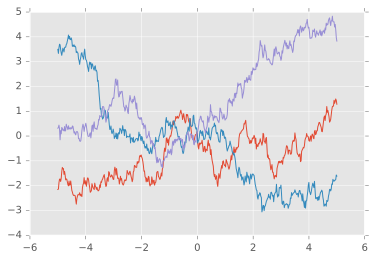

In [100]:
k = GPy.kern.Brownian(input_dim=1, variance=1.)
mu = np.zeros((500)) # vector of the means
C = k.K(X,X) # covariance matrix

# Generate 20 sample path with mean mu and covariance C
Z = np.random.multivariate_normal(mu,C,20)
plt.figure() # open new plotting window
for i in range(3):
    plt.plot(X[:],Z[i,:])


In [186]:
F = 2

xGCD = np.array(np.arange(1, 30, 0.5), ndmin=2).T
XGCD = np.array(5, ndmin=2).T
YGCD = np.array(12, ndmin=2).T

nNew = len(xGCD)
nObs = len(XGCD)

# prior on w
S = np.eye(nObs)

# use .shape to get the dimensions of a matrix. 
m = np.zeros((nNew, 1))
M = np.zeros((nObs, 1))

kxx = xGCD%xGCD
kxX = xGCD%XGCD
kXX = XGCD%XGCD + 0.0001 * np.eye(nObs) # add noise to have a pos def. 

IkXX = np.linalg.inv(kXX)

mpost = m + kxX.dot(IkXX).dot(YGCD - M) 
vpost = kxx - kxX.dot(IkXX).dot(kxX.T)
sdpost = np.array(np.sqrt(-vpost.diagonal()), ndmin=2).T

<Container object of 3 artists>

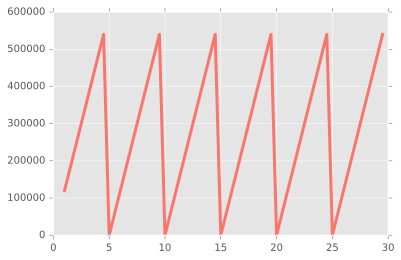

In [188]:
plt.plot(xGCD, mpost, color="#F8766D", linewidth=3)
#plt.plot(xGCD, mpost + sdpost, color="#F8766D", linewidth=2, alpha=0.3)
#plt.plot(xGCD, mpost - sdpost, color="#F8766D", linewidth=2, alpha=0.3)
plt.errorbar(XGCD, YGCD, yerr=1, fmt='+', color="#00BFC4", markersize=10, linewidth=3)

## Conclusion

Gaussian are easy to compute with. Linear Algebra for inference. 

Use nonlinear features to do nonlinear regression. 

At the limit, you get nonparametric regression (using GPs).

GPs are defined by $\Large m$ and $\Large K$

Next time: How to model with GPs.